## MULTIPLE KERNEL LEARNING 
This file implements using MKL to combine the various features that we have access to. First experiments

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
from sklearn.model_selection import train_test_split

from PyMKL import MKL
from PyMKL.kernels import kernel_stack, get_W_and_D

In [49]:
# Load the data
df = pd.read_csv('/home/gmarti/DATA/FETAL_GRAPHANALYSIS_DATA/CLEANED_DATA/cleaned_data_surf_combat.csv')

# Print distributions of GRUPO variable
print(df['GRUPO'].value_counts())
print(df['sex'].value_counts())

GRUPO_labels = {
    1: 'ACC',
    2: 'DISGENESIA_CC',
    3: 'CC<5',
    4: 'IUGR',
    5: 'CONTROLS VM',
    6: 'CONTROLS  MULTIFACT',
    7: 'CONTROLS DHCP',
    8: "VM"
}


# Create new column named "DX", following the GRUPO_labels dictionary
df['DX'] = df['GRUPO'].map(GRUPO_labels)


7.0    189
6.0     46
4.0     42
5.0     29
8.0     10
Name: GRUPO, dtype: int64
M    179
F    137
Name: sex, dtype: int64


In [50]:
features = [
    "volume",
    "volume_CSF",
    "volume_Cortical_gray_matter",
    "volume_White_matter",
    "mean_curvature_mean",
    "gaussian_curvature_mean",
    "curvedness_index_mean",
    "folding_index_mean",
    "shape_index_mean",
    "spangy_dom_band_mean",
    "mean_curvature",
    "mean_thickness",
    "mean_sulc",
    "dpf_mean",
    "LGI_mean",
    "GI",
    "B1", "B2", "B3", "B4", "B5", "B6",
    # "supratentorial_volume",
    "cerebellar_supratentorial_ratio",
]

from sklearn.linear_model import LinearRegression
from pygam import LinearGAM, s
gest_weeks = df['gestational_weeks'].values

# Normalize the features
# Normalize separately by SITE
# df[features] = df.groupby('SITE')[features].transform(lambda x: (x - x.mean()) / x.std())

# create subset of df with only the features we want
df_subset = df[features]

residuals = []

detrend=True
if detrend:
    # Detrend the features
    for feature in features:
        biomarker_values = df_subset[feature]
        # model = LinearRegression()  
        gestational_ages = gest_weeks.reshape(-1, 1)
        # model.fit(gestational_ages, df_subset[feature])
        # predicted = model.predict(gestational_ages)
        gam = LinearGAM(s(0))
        gam.gridsearch(gestational_ages, biomarker_values)
        predicted = gam.predict(gestational_ages)
        
        residuals.append(biomarker_values - predicted)



# Normalize the features if norm=True
norm=False
if norm:
    # normalize all, not by site
    df_subset[features] = (df_subset[features] - df_subset[features].mean()) / df_subset[features].std()

# Get the features as a numpy file of shape (n_samples, n_features)
X_full = df_subset[features].values

if detrend:
    X_residuals = np.array(residuals).T
    X_full = X_residuals

# Say how many NAs we have for each feature
#and how many zeros
for feature in features:
    print(f"Feature {feature} has {np.sum(np.isnan(df_subset[feature]))} NAs and {np.sum(df_subset[feature] == 0)} zeros")



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00

Feature volume has 0 NAs and 0 zeros
Feature volume_CSF has 0 NAs and 0 zeros
Feature volume_Cortical_gray_matter has 0 NAs and 0 zeros
Feature volume_White_matter has 0 NAs and 0 zeros
Feature mean_curvature_mean has 0 NAs and 0 zeros
Feature gaussian_curvature_mean has 0 NAs and 0 zeros
Feature curvedness_index_mean has 0 NAs and 0 zeros
Feature folding_index_mean has 0 NAs and 0 zeros
Feature shape_index_mean has 0 NAs and 0 zeros
Feature spangy_dom_band_mean has 0 NAs and 0 zeros
Feature mean_curvature has 0 NAs and 0 zeros
Feature mean_thickness has 0 NAs and 0 zeros
Feature mean_sulc has 0 NAs and 0 zeros
Feature dpf_mean has 0 NAs and 0 zeros
Feature LGI_mean has 0 NAs and 0 zeros
Feature GI has 0 NAs and 0 zeros
Feature B1 has 0 NAs and 0 zeros
Feature B2 has 0 NAs and 0 zeros
Feature B3 has 0 NAs and 0 zeros
Feature B4 has 0 NAs and 0 zeros
Feature B5 has 0 NAs and 0 zeros
Feature B6 has 0 NAs and 0 zeros
Feature cerebellar_supratentorial_ratio has 0 NAs and 0 zeros


In [51]:
# # Plot the residuals against gestational age with seaborn and add correlation coefficient
# import seaborn as sns
# import scipy.stats as stats

# for i, feature in enumerate(features):
#     corr, _ = stats.pearsonr(gest_weeks, residuals[i])
    
#     plt.figure(figsize=(10, 6))
#     sns.regplot(x=gest_weeks, y=residuals[i], scatter_kws={'alpha': 0.5})
#     plt.title(f"Residuals of {feature} against gestational age\nCorrelation: {corr:.3f}")
#     plt.xlabel("Gestational age")
#     plt.ylabel("Residuals")
#     plt.text(0.05, 0.95, f"r = {corr:.3f}", transform=plt.gca().transAxes, 
#              verticalalignment='top')
#     plt.show()


In [52]:
## Create the kernels
## Start with linear and rbf kernels

# Separate the features
X = [X_full[:,i] for i in range(X_full.shape[1])]
# decide kernels
# kernel should be the same length as X
kernel = ["euclidean" for i in range(len(X))]
# KNN (see paper for value)
# knn = 5

# Another kernel: gestational age, with kernel "gaussian"
#X.append(df['gestational_weeks'].values)
#kernel.append("euclidean")

# Final kernel: sex, with kernel "categorical"
# X.append((df['sex'] == 'M').astype(int).values)  # Convert 'M' to 1, 'F' to 0
# kernel.append("categorical")

# call the kernel stack function
K, var = kernel_stack(X, kernel, alpha=-0.5, knn=50, return_sigmas=False)# , gestational_ages=gest_weeks, sigma_age=5.5)

# Get W and D
W, D = get_W_and_D(K, var)

# do W or D have any NAs?
print(np.sum(np.isnan(W)))
print(np.sum(np.isnan(D)))

# Print the shape of K, W, D and var
print("K shape: ", K.shape)
print("W shape: ", W.shape)
print("D shape: ", D.shape)
print("var shape: ", var.shape)


0
0
K shape:  (23, 316, 316)
W shape:  (316, 316)
D shape:  (316, 1)
var shape:  (23,)


6


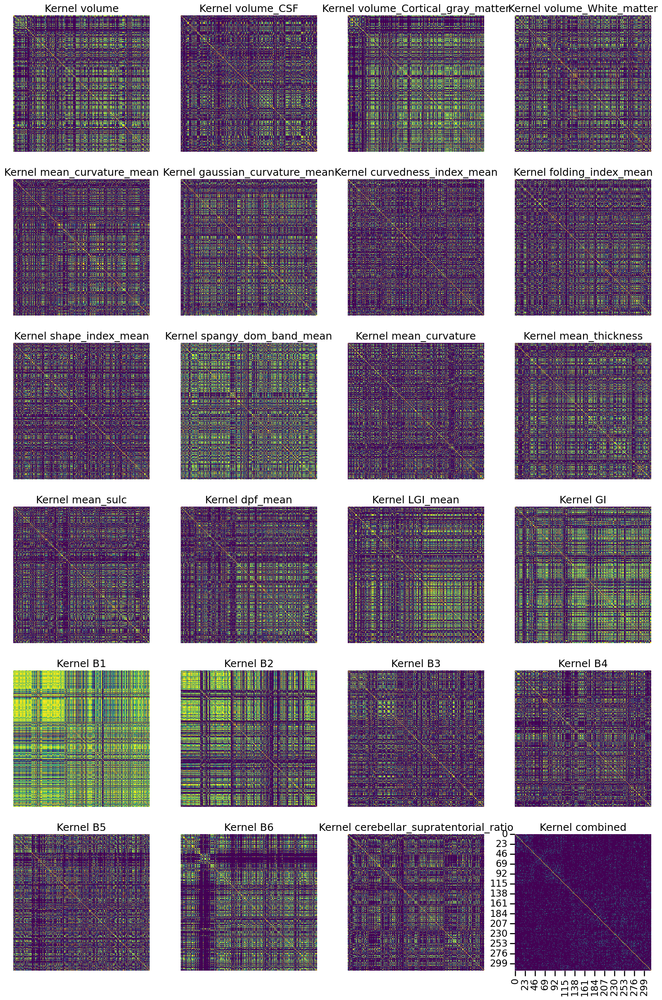

In [53]:
# Plot all the kernels and the combined kernel W
# Set up the figure size
import math

# Calculate the total plots needed (21 kernels in K plus 1 for W)
total_plots = K.shape[0] + 1

# add gestational_weeks and sex to the features list
# features.append("gestational_weeks")
#features.append("sex")

# Determine grid dimensions to be as square as possible
cols = 4
rows = math.ceil(total_plots/cols)
print(rows)
plt.figure(figsize=(20, 30))  # Adjust the size as needed
# Plot each kernel from K
for i in range(len(features)):

    plt.subplot(rows, cols, i + 1)
    sns.heatmap(K[i], cmap='viridis', square=True, cbar=False)
    # disable ticks for better visibility
    plt.xticks([])
    plt.yticks([])

    plt.title(f'Kernel {features[i]}')

    # Break after i==5

# Plot W separately
plt.subplot(rows, cols, total_plots)
sns.heatmap(W, cmap='viridis', square=True, cbar=False)
plt.title('Kernel combined')

plt.show()


In [54]:
## Train MKL
mkl = MKL(K=K, W=W, D=D, solver='smcp', maxiter=50)
mkl.fit()
Proj = mkl.transform()

# print shape of projection
print(Proj.shape)

Iteration   0/ 50, Energy        nan (> tolerance        inf):   0%| | 0/50 [00:

Iteration  50/ 50, Energy   0.003573 (> tolerance   0.000469): 100%|█| 50/50 [08

Converged!
(316, 315)


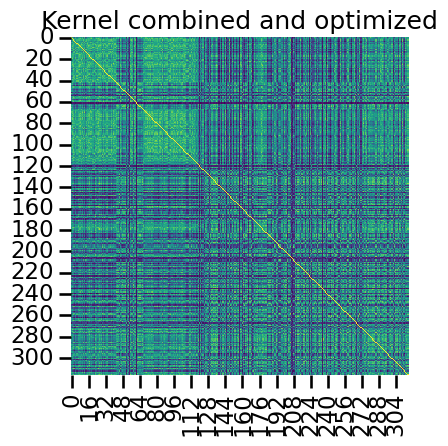

In [55]:
# Plot the final kernel
# Plot W separately

# Combine the kernels using mkl.betas
W = np.zeros((len(df_subset), len(df_subset)))
for i, beta in enumerate(mkl.betas):
    W += beta * K[i]


sns.heatmap(W, cmap='viridis', square=True, cbar=False)
plt.title('Kernel combined and optimized')
plt.tight_layout()  # Adjust subplots to fit into the figure area.
plt.show()


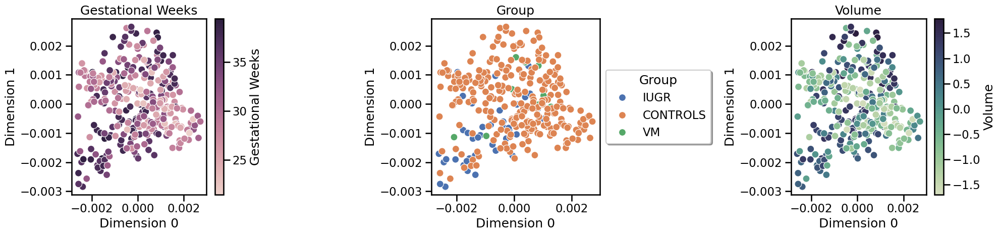

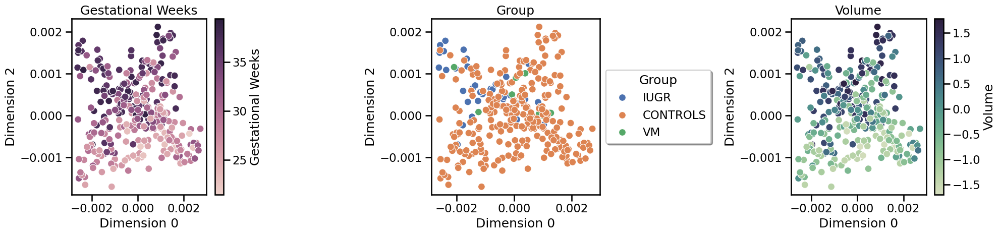

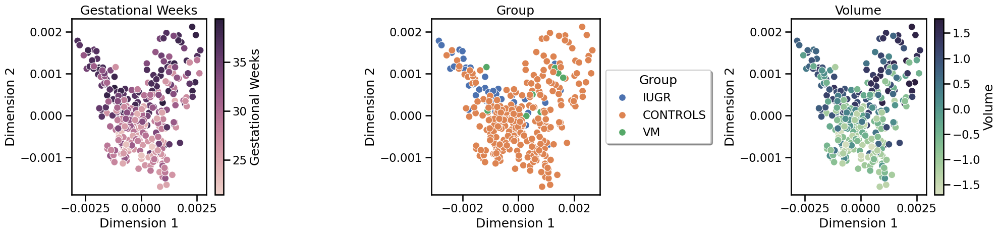

In [56]:
# change GRUPO column in df_subset 4 to FGR and 6 to HC

dimension_pairs = [(0, 1), (0, 2), (1, 2)]

# Lump together all controls
df['DX'] = df['DX'].apply(lambda x: 'IUGR' if x == 'IUGR' else 'VM' if x == 'VM' else 'CONTROLS')



# set seaborn style for talk
sns.set_context(context="talk")

for (x,y) in dimension_pairs:

    # Create a figure with subplots
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))

    cmap_gestational_weeks = sns.cubehelix_palette(as_cmap=True)
    cmap_volume = sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True)

    # Plot for Gestational Weeks with a colorbar
    scatter = sns.scatterplot(x=Proj[:, x], y=Proj[:, y], hue=df['gestational_weeks'],
                            palette=cmap_gestational_weeks, ax=ax[0], s=100, edgecolor='w', legend=False)
    ax[0].set_title('Gestational Weeks')
    ax[0].set_xlabel(f'Dimension {x}')
    ax[0].set_ylabel(f'Dimension {y}')
    # Add a colorbar
    norm = plt.Normalize(df['gestational_weeks'].min(), df['gestational_weeks'].max())
    sm = plt.cm.ScalarMappable(cmap=cmap_gestational_weeks, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax[0], orientation='vertical', label='Gestational Weeks')

    # Plot for Group with discrete legend
    sns.scatterplot(x=Proj[:, x], y=Proj[:, y], hue=df['DX'],
                    palette="deep", ax=ax[1], s=100, edgecolor='w')
    ax[1].set_title('Group')
    ax[1].set_xlabel(f'Dimension {x}')
    ax[1].set_ylabel(f'Dimension {y}')
    ax[1].legend(title='Group', loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, shadow=True)

    # Plot for Volume with a colorbar
    scatter = sns.scatterplot(x=Proj[:, x], y=Proj[:, y], hue=df['volume'],
                            palette=cmap_volume, ax=ax[2], s=100, edgecolor='w', legend=False)
    ax[2].set_title('Volume')
    ax[2].set_xlabel(f'Dimension {x}')
    ax[2].set_ylabel(f'Dimension {y}')
    # Add a colorbar
    norm = plt.Normalize(df['volume'].min(), df['volume'].max())
    sm = plt.cm.ScalarMappable(cmap=cmap_volume, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax[2], orientation='vertical', label='Volume')

    plt.tight_layout()
    plt.show()


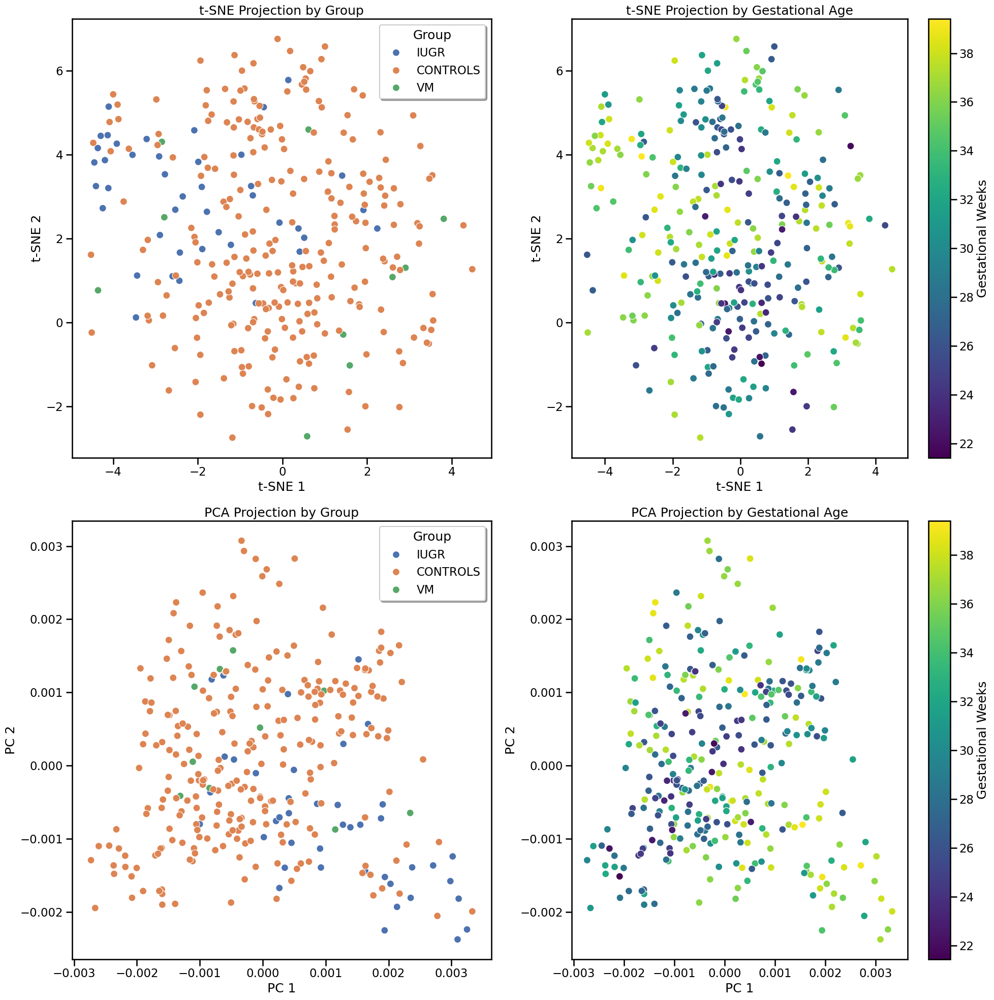

In [57]:
# Plot the Proj variable using t-SNE and PCA
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
proj_tsne = tsne.fit_transform(Proj)

# Apply PCA
pca = PCA(n_components=2)
proj_pca = pca.fit_transform(Proj)

# Plot t-SNE and PCA results
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# t-SNE plot by DX
sns.scatterplot(x=proj_tsne[:, 0], y=proj_tsne[:, 1], hue=df['DX'],
                palette="deep", ax=ax1, s=100, edgecolor='w')
ax1.set_title('t-SNE Projection by Group')
ax1.set_xlabel('t-SNE 1')
ax1.set_ylabel('t-SNE 2')
ax1.legend(title='Group', loc='best', frameon=True, shadow=True)

# t-SNE plot by gestational age
scatter = sns.scatterplot(x=proj_tsne[:, 0], y=proj_tsne[:, 1], hue=df['gestational_weeks'],
                          palette='viridis', ax=ax2, s=100, edgecolor='w', legend=False)
ax2.set_title('t-SNE Projection by Gestational Age')
ax2.set_xlabel('t-SNE 1')
ax2.set_ylabel('t-SNE 2')
norm = plt.Normalize(df['gestational_weeks'].min(), df['gestational_weeks'].max())
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax2, orientation='vertical', label='Gestational Weeks')

# PCA plot by DX
sns.scatterplot(x=proj_pca[:, 0], y=proj_pca[:, 1], hue=df['DX'],
                palette="deep", ax=ax3, s=100, edgecolor='w')
ax3.set_title('PCA Projection by Group')
ax3.set_xlabel('PC 1')
ax3.set_ylabel('PC 2')
ax3.legend(title='Group', loc='best', frameon=True, shadow=True)

# PCA plot by gestational age
scatter = sns.scatterplot(x=proj_pca[:, 0], y=proj_pca[:, 1], hue=df['gestational_weeks'],
                          palette='viridis', ax=ax4, s=100, edgecolor='w', legend=False)
ax4.set_title('PCA Projection by Gestational Age')
ax4.set_xlabel('PC 1')
ax4.set_ylabel('PC 2')
norm = plt.Normalize(df['gestational_weeks'].min(), df['gestational_weeks'].max())
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax4, orientation='vertical', label='Gestational Weeks')

plt.tight_layout()
plt.show()


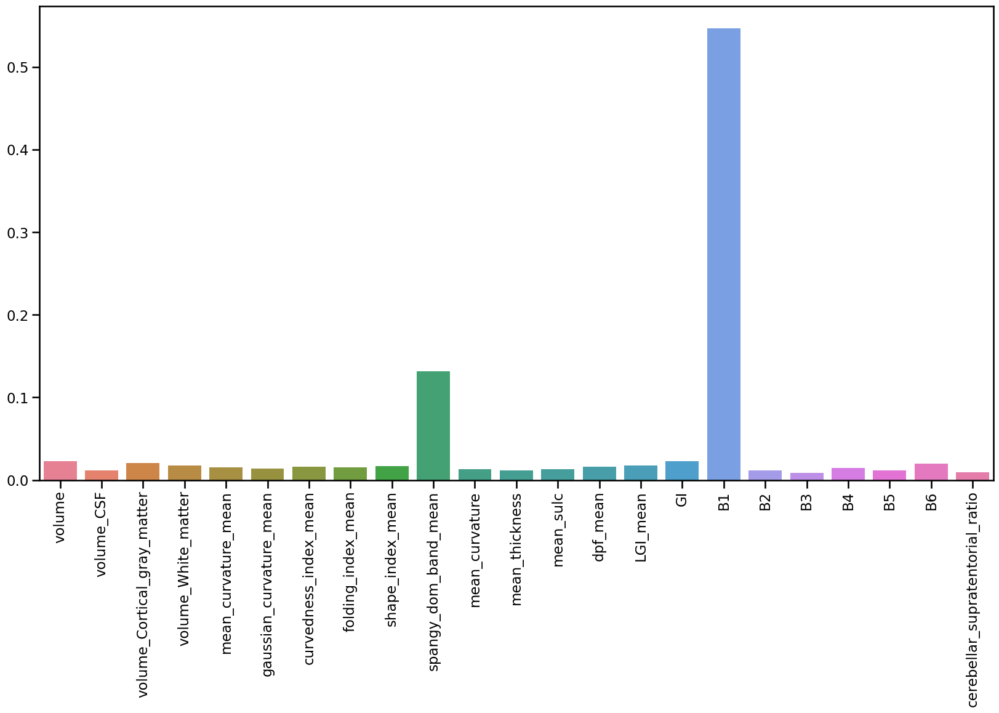

In [58]:
# Plot the weights
# is the D?
weights = mkl.betas

# create a dict where the key is a feature and the value is the weight
weights_dict = {features[i]: weights[i] for i in range(len(features))}

# Plot the weights
plt.figure(figsize=(20, 10))
sns.barplot(weights_dict)
# put the x labels in 45 angle
plt.xticks(rotation=90)
plt.show()



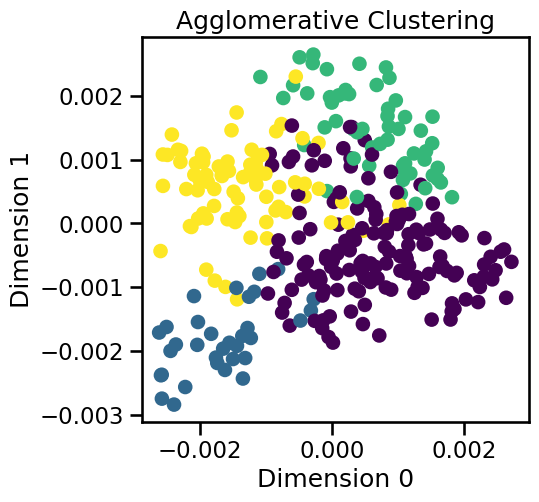

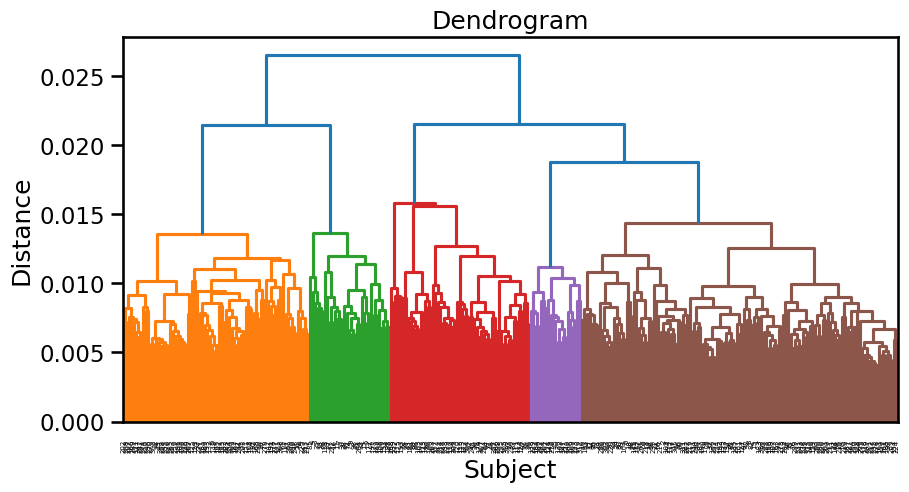

In [59]:
## Clustering
# Use agglomerative clustering
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

# Step 2: Apply Agglomerative Clustering
# Using 2 clusters and the 'ward' linkage method, which minimizes the variance of clusters being merged.
cluster = AgglomerativeClustering(n_clusters=4, linkage='ward')
cluster_labels = cluster.fit_predict(Proj)

# Step 3: Visualize the clusters
plt.figure(figsize=(5, 5))
plt.scatter(Proj[:, 0], Proj[:, 1], c=cluster_labels, cmap='viridis', marker='o')
plt.title('Agglomerative Clustering')
plt.xlabel('Dimension 0')
plt.ylabel('Dimension 1')
plt.show()

# Optional: Visualize the hierarchical clustering as a dendro
# This requires computing the full linkage matrix again, since sklearn doesn't return it
from sklearn.neighbors import NearestCentroid
import scipy.cluster.hierarchy as sch

# Calculate linkage matrix for the dendrogram
linkage_matrix = sch.linkage(Proj, method='ward')
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Subject')
plt.ylabel('Distance')
plt.show()


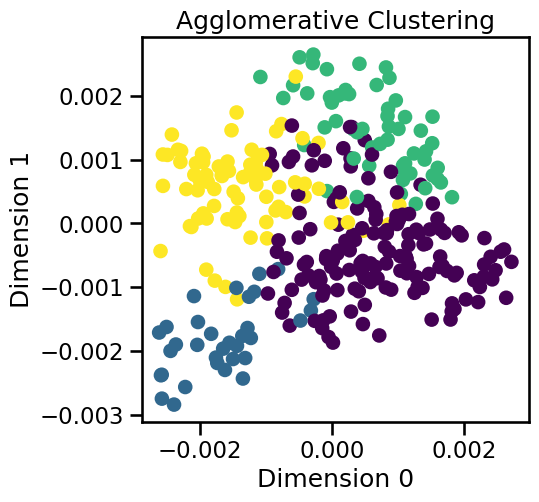

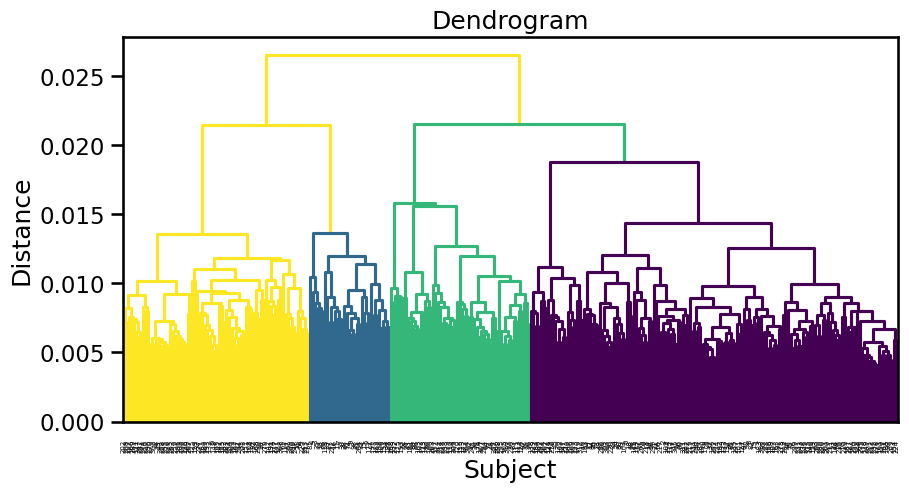

In [60]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
import scipy.cluster.hierarchy as sch
from matplotlib.colors import to_hex

# Generate sample data
np.random.seed(0)

# Step 2: Apply Agglomerative Clustering
cluster = AgglomerativeClustering(n_clusters=4, linkage='ward')
cluster_labels = cluster.fit_predict(Proj)

# Step 3: Visualize the clusters
plt.figure(figsize=(5, 5))
scatter = plt.scatter(Proj[:, 0], Proj[:, 1], c=cluster_labels, cmap='viridis', marker='o')
plt.title('Agglomerative Clustering')
plt.xlabel('Dimension 0')
plt.ylabel('Dimension 1')
plt.show()

# Step 4: Calculate linkage matrix for the dendrogram
linkage_matrix = sch.linkage(Proj, method='ward')

# Step 5: Create a mapping of the colors from the cluster labels
# Use the viridis colormap
cmap = plt.cm.viridis
colors = cmap(np.linspace(0, 1, len(np.unique(cluster_labels))))
label_color_dict = {label: to_hex(colors[i]) for i, label in enumerate(np.unique(cluster_labels))}

# Step 6: Create a function to get the color for each link
def get_link_colors(linkage_matrix, cluster_labels):
    # Initially, each point is in its own cluster
    cluster_ids = {i: [i] for i in range(len(cluster_labels))}

    # Function to map a cluster id to the cluster's color
    def color_from_cluster(cluster_id):
        # Get the original cluster label from any member of the cluster
        original_label = cluster_labels[cluster_ids[cluster_id][0]]
        return label_color_dict[original_label]

    # Colors for the dendrogram links
    link_colors = {}

    # Iterate over each merge step
    for i, (idx1, idx2, _, _) in enumerate(linkage_matrix):
        cluster_id = len(cluster_labels) + i
        link_colors[cluster_id] = color_from_cluster(idx1)
        
        # Merge clusters
        cluster_ids[cluster_id] = cluster_ids.pop(idx1) + cluster_ids.pop(idx2)

    return link_colors

# Get the link colors
link_colors = get_link_colors(linkage_matrix, cluster_labels)

# Step 7: Apply the colors to the dendrogram
def color_linkage(link):
    return link_colors[link]

plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix, link_color_func=color_linkage)
plt.title('Dendrogram')
plt.xlabel('Subject')
plt.ylabel('Distance')
plt.show()


In [61]:
### Cluster analysis
# For each cluster, calculate the mean and std of gestational age, volume, cortical thickness, and % of GRUPO and sex_at_birth
# Create a new dataframe with the cluster labels
df_clusters = df.copy()
df_clusters['cluster'] = cluster_labels

print(df_clusters['GRUPO'].value_counts())


# Calculate the mean and std for each cluster
df_clusters.groupby('cluster').agg({'gestational_weeks': ['mean', 'std'],
                                    'volume': ['mean', 'std'],
                                    'mean_thickness': ['mean', 'std'],
                                    'mean_sulc': ['mean','std'],
                                    'GRUPO': lambda x: (x == 6).mean(),
                                    'sex': lambda x: (x == "M").mean()})

    

7.0    189
6.0     46
4.0     42
5.0     29
8.0     10
Name: GRUPO, dtype: int64


gestational_weeks              volume           mean_thickness  \
                     mean       std      mean       std           mean   
cluster                                                                  
0               30.366533  4.930591 -0.197558  0.968933      -0.751222   
1               35.543939  2.918364  0.581130  0.601969      -1.836770   
2               32.844211  4.529010  0.527882  0.994786      -1.033748   
3               30.478026  4.506380 -0.227067  0.926406      -0.721578   

                  mean_sulc               GRUPO       sex  
              std      mean       std  <lambda>  <lambda>  
cluster                                                    
0        0.856024  0.592376  1.029526  0.140000  0.533333  
1        0.779420  2.000025  0.599027  0.151515  0.424242  
2        1.055867  0.980229  0.851153  0.298246  0.754386  
3        0.982223  0.646436  1.047350  0.039474  0.552632